# Snow spatial

In [1]:
# librariies
import xarray as xr
import numpy as np
import pandas as pd

import rasterio.features
import geopandas as gpd
from shapely.geometry import shape

from netCDF4 import Dataset

from snobedo.snotel import SnotelLocations
from snobedo.snotel import SnotelLocations, CsvParser

from snobedo.lib.dask_utils import start_cluster, client_ip_and_port

from pathlib import Path, PurePath

import matplotlib.pyplot as plt

In [2]:
# DEM INFO
UVU_OLSON_HOME = '/uufs/chpc.utah.edu/common/home/uvu-group1/olson/snow-data/'
HRRR_DATA = UVU_OLSON_HOME + 'HRRR/'
ERW_TOPO_FILE = UVU_OLSON_HOME + 'isnobal-data/ERW_topo.nc'

with Dataset(ERW_TOPO_FILE) as dem:
    sky_view_factor = dem['sky_view_factor'][:].astype(np.float64)
    dem = dem['dem'][:].astype(np.float64)

In [3]:
with Dataset(ERW_TOPO_FILE) as s:
    slope = s['slope'][:].astype(np.float64)

In [4]:

# 1. Open dataset and load the mask variable (assumes 'mask' is 2D)
ds = xr.open_dataset(ERW_TOPO_FILE)
mask = ds['mask'].values  # numpy array
x = ds['x'].values  # or ds['lon'].values
y = ds['y'].values  # or ds['lat'].values

from affine import Affine
x_res = (x[-1] - x[0]) / (len(x) - 1)
y_res = (y[-1] - y[0]) / (len(y) - 1)
transform = Affine.translation(x[0] - x_res / 2, y[0] - y_res / 2) * Affine.scale(x_res, y_res)
mask_bool = mask.astype(bool)
shapes_generator = rasterio.features.shapes(mask_bool.astype(np.uint8), transform=transform)
polygons = [shape(geom) for geom, value in shapes_generator if value == 1]
crs = ds.attrs.get('crs', 'EPSG:26913')  # Replace if no CRS attribute or set your own
gdf = gpd.GeoDataFrame({'geometry': polygons}, crs=crs)

print(f"Extracted {len(gdf)} polygons from mask.")


Extracted 1 polygons from mask.


In [5]:
from dask.distributed import Client
from dask_jobqueue import SLURMCluster

cluster = SLURMCluster(
    cores=8,
    processes=4,
    memory="32GB",
    # memory="16GB",
    account="notchpeak-shared-short", # project
    queue="notchpeak-shared-short",
    walltime="2:00:00",
)

# Scale the cluster — adjust this based on your workload
cluster.scale(jobs=2)  # e.g., 2 jobs → 2 × 8 = 16 cores total

client = Client(cluster)  # Attach Dask client to the cluster

In [6]:

start_date = '2022-12-01'
end_date = '2023-05-01'

file_pattern = '/uufs/chpc.utah.edu/common/home/u1037042/olson/snow-data/results/isnobal_simulations/hrrr_toposplit/sw/erw_spires_dsw3/wy2023/erw_50m/run*/snow.nc'

isno22 = xr.open_mfdataset(
    file_pattern,
    combine='by_coords',
    parallel=True,
    chunks={'time': 24}
)
mean_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()


# # # #
file_pattern1 = '/uufs/chpc.utah.edu/common/home/u1037042/olson/snow-data/results/isnobal_simulations/hrrr_toposplit/sw/erw_spires_dsw1/wy2023/erw_50m/run*/snow.nc'

isno22_dsw1 = xr.open_mfdataset(
    file_pattern1,
    combine='by_coords',
    parallel=True,
    chunks={'time': 24}
)
mean_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()


# # # # #
file_pattern2 = '/uufs/chpc.utah.edu/common/home/u1037042/olson/snow-data/results/isnobal_simulations/hrrr_toposplit/sw/erw_spires_ghi/wy2023/erw_50m/run*/snow.nc'
isno22_ghi = xr.open_mfdataset(
    file_pattern2,
    combine='by_coords',
    parallel=True,
    chunks={'time': 24}
)
mean_ghi = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()


dsw3_base = (mean_dsw3 - mean_ghi)
dsw3_shade = (mean_dsw3 - mean_dsw1)
dsw1_base = (mean_dsw1 - mean_ghi)


In [9]:
dsw3_base

<xarray.DataArray 'thickness' (y: 837, x: 656)> Size: 2MB
array([[ 0.09896255,  0.0943377 ,  0.09267128, ..., -0.03935266,
        -0.03936434, -0.03629327],
       [ 0.10086799,  0.09695899,  0.09892213, ..., -0.0467447 ,
        -0.04504192, -0.04187334],
       [ 0.09462547,  0.09695172,  0.09723032, ..., -0.05569744,
        -0.05496335, -0.05232465],
       ...,
       [-0.0492678 ,  0.02141553,  0.10799909, ..., -0.02914549,
        -0.0263678 , -0.04731147],
       [ 0.14236426,  0.22029698,  0.25682813, ..., -0.04971755,
        -0.05493687, -0.0706273 ],
       [ 0.23221952,  0.2812219 ,  0.30472985, ..., -0.04910579,
        -0.06055129, -0.09396663]], dtype=float32)
Coordinates:
  * y        (y) float32 3kB 4.323e+06 4.323e+06 ... 4.281e+06 4.281e+06
  * x        (x) float32 3kB 3.159e+05 3.16e+05 3.16e+05 ... 3.486e+05 3.487e+05

In [7]:

start_date = '2023-02-01'
end_date = '2023-02-28'

feb_ghi = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
feb_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
feb_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

start_date = '2023-03-01'
end_date = '2023-03-31'

mar_ghi =isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
mar_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
mar_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

start_date = '2023-04-01'
end_date = '2023-04-30'

apr_ghi = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
apr_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
apr_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

apr1 = apr_dsw3 - apr_ghi
apr2 = apr_dsw3 - apr_dsw1
apr3 = apr_dsw1 - apr_ghi

mar1 = mar_dsw3 - mar_ghi
mar2 = mar_dsw3 - mar_dsw1
mar3 = mar_dsw1 - mar_ghi

feb1 = feb_dsw3 - feb_ghi
feb2 = feb_dsw3 - feb_dsw1
feb3 = feb_dsw1 - feb_ghi

# December 2021
start_date = '2022-12-01'
end_date = '2022-12-31'

dec_ghi = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
dec_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
dec_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

dec1 = dec_dsw3 - dec_ghi
dec2 = dec_dsw3 - dec_dsw1
dec3 = dec_dsw1 - dec_ghi

# January 2022
start_date = '2023-01-01'
end_date = '2023-01-31'

jan_ghi = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
jan_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
jan_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

jan1 = jan_dsw3 - jan_ghi
jan2 = jan_dsw3 - jan_dsw1
jan3 = jan_dsw1 - jan_ghi

# May 2022
start_date = '2023-05-01'
end_date = '2023-05-31'

may_ghi = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
may_dsw1 = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
may_dsw3 = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

may1 = may_dsw3 - may_ghi
may2 = may_dsw3 - may_dsw1
may3 = may_dsw1 - may_ghi




In [8]:
# --- February 1st, 2022 ---
start_date = '2023-02-01T00:00'
end_date = '2023-02-01T23:00'

feb_ghi_day = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
feb_dsw1_day = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
feb_dsw3_day = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

feb1_day = feb_dsw3_day - feb_ghi_day
feb2_day = feb_dsw3_day - feb_dsw1_day
feb3_day = feb_dsw1_day - feb_ghi_day

# --- March 1st, 2022 ---
start_date = '2023-03-01T00:00'
end_date = '2023-03-01T23:00'

mar_ghi_day = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
mar_dsw1_day = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
mar_dsw3_day = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

mar1_day = mar_dsw3_day - mar_ghi_day
mar2_day = mar_dsw3_day - mar_dsw1_day
mar3_day = mar_dsw1_day - mar_ghi_day

# --- April 1st, 2022 ---
start_date = '2023-04-01T00:00'
end_date = '2023-04-01T23:00'

apr_ghi_day = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
apr_dsw1_day = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
apr_dsw3_day = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

apr1_day = apr_dsw3_day - apr_ghi_day
apr2_day = apr_dsw3_day - apr_dsw1_day
apr3_day = apr_dsw1_day - apr_ghi_day

# --- May 1st, 2022 ---
start_date = '2023-05-01T00:00'
end_date = '2023-05-01T23:00'

may_ghi_day = isno22_ghi['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
may_dsw1_day = isno22_dsw1['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()
may_dsw3_day = isno22['thickness'].sel(time=slice(start_date, end_date)).mean(dim='time').compute()

may1_day = may_dsw3_day - may_ghi_day
may2_day = may_dsw3_day - may_dsw1_day
may3_day = may_dsw1_day - may_ghi_day


In [13]:
may1_day

<xarray.DataArray 'thickness' (y: 837, x: 656)> Size: 2MB
array([[ 0.2156372 ,  0.23513794,  0.27166748, ..., -0.06359863,
        -0.06573486, -0.06262207],
       [ 0.20907593,  0.23272705,  0.2859192 , ..., -0.07885742,
        -0.07196045, -0.06945801],
       [ 0.20230103,  0.2338562 ,  0.26501465, ..., -0.08734131,
        -0.08731079, -0.08151245],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]], dtype=float32)
Coordinates:
  * y        (y) float32 3kB 4.323e+06 4.323e+06 ... 4.281e+06 4.281e+06
  * x        (x) float32 3kB 3.159e+05 3.16e+05 3.16e+05 ... 3.486e+05 3.487e+05

In [30]:
client

<Client: 'tcp://10.242.75.81:42835' processes=4 threads=8, memory=29.80 GiB>

In [31]:
client.shutdown()

In [10]:
# # SAVE DATA
# import os

# # Create folder if it doesn't already exist
# save_dir = 'snow-spatial-data-2023'
# os.makedirs(save_dir, exist_ok=True)

# # MAIN - full time period
# mean_dsw3.to_netcdf(os.path.join(save_dir, 'snow_spatial_mean_dsw3.nc'))
# mean_dsw1.to_netcdf(os.path.join(save_dir, 'snow_spatial_mean_dsw1.nc'))
# mean_ghi.to_netcdf(os.path.join(save_dir, 'snow_spatial_mean_ghi.nc'))
# # MONTHS
# jan_dsw3.to_netcdf(os.path.join(save_dir, 'snow_spatial_jan_dsw3.nc'))
# jan_dsw1.to_netcdf(os.path.join(save_dir, 'snow_spatial_jan_dsw1.nc'))
# jan_ghi.to_netcdf(os.path.join(save_dir, 'snow_spatial_jan_ghi.nc'))
# # February
# feb_dsw3.to_netcdf(os.path.join(save_dir, 'snow_spatial_feb_dsw3.nc'))
# feb_dsw1.to_netcdf(os.path.join(save_dir, 'snow_spatial_feb_dsw1.nc'))
# feb_ghi.to_netcdf(os.path.join(save_dir, 'snow_spatial_feb_ghi.nc'))
# # March
# mar_dsw3.to_netcdf(os.path.join(save_dir, 'snow_spatial_mar_dsw3.nc'))
# mar_dsw1.to_netcdf(os.path.join(save_dir, 'snow_spatial_mar_dsw1.nc'))
# mar_ghi.to_netcdf(os.path.join(save_dir, 'snow_spatial_mar_ghi.nc'))
# # April
# apr_dsw3.to_netcdf(os.path.join(save_dir, 'snow_spatial_apr_dsw3.nc'))
# apr_dsw1.to_netcdf(os.path.join(save_dir, 'snow_spatial_apr_dsw1.nc'))
# apr_ghi.to_netcdf(os.path.join(save_dir, 'snow_spatial_apr_ghi.nc'))
# # May
# may_dsw3.to_netcdf(os.path.join(save_dir, 'snow_spatial_may_dsw3.nc'))
# may_dsw1.to_netcdf(os.path.join(save_dir, 'snow_spatial_may_dsw1.nc'))
# may_ghi.to_netcdf(os.path.join(save_dir, 'snow_spatial_may_ghi.nc'))

# may_dsw3_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_may1_dsw3.nc'))
# may_dsw1_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_may1_dsw1.nc'))
# may_ghi_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_may1_ghi.nc'))

# apr_dsw3_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_apr1_dsw3.nc'))
# apr_dsw1_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_apr1_dsw1.nc'))
# apr_ghi_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_apr1_ghi.nc'))

# # Save February 1st
# feb_dsw3_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_feb1_dsw3.nc'))
# feb_dsw1_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_feb1_dsw1.nc'))
# feb_ghi_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_feb1_ghi.nc'))

# # Save March 1st
# mar_dsw3_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_mar1_dsw3.nc'))
# mar_dsw1_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_mar1_dsw1.nc'))
# mar_ghi_day.to_netcdf(os.path.join(save_dir, 'snow_spatial_mar1_ghi.nc'))



In [5]:
# LOAD in files
import os
save_dir = 'snow-spatial-data'

# Loda Main
mean_dsw3 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mean_dsw3.nc'))
mean_dsw1 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mean_dsw1.nc'))
mean_ghi  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mean_ghi.nc'))
# Load January
jan_dsw3 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_jan_dsw3.nc'))
jan_dsw1 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_jan_dsw1.nc'))
jan_ghi  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_jan_ghi.nc'))
# Load February
feb_dsw3 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_feb_dsw3.nc'))
feb_dsw1 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_feb_dsw1.nc'))
feb_ghi  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_feb_ghi.nc'))
# Load March
mar_dsw3 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mar_dsw3.nc'))
mar_dsw1 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mar_dsw1.nc'))
mar_ghi  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mar_ghi.nc'))
# Load April
apr_dsw3 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_apr_dsw3.nc'))
apr_dsw1 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_apr_dsw1.nc'))
apr_ghi  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_apr_ghi.nc'))
# Load May
may_dsw3 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_may_dsw3.nc'))
may_dsw1 = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_may_dsw1.nc'))
may_ghi  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_may_ghi.nc'))

# May 1st
may_dsw3_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_may1_dsw3.nc'))
may_dsw1_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_may1_dsw1.nc'))
may_ghi_day  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_may1_ghi.nc'))

# April 1st
apr_dsw3_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_apr1_dsw3.nc'))
apr_dsw1_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_apr1_dsw1.nc'))
apr_ghi_day  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_apr1_ghi.nc'))

# Load February 1st
feb_dsw3_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_feb1_dsw3.nc'))
feb_dsw1_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_feb1_dsw1.nc'))
feb_ghi_day  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_feb1_ghi.nc'))

# Load March 1st
mar_dsw3_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mar1_dsw3.nc'))
mar_dsw1_day = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mar1_dsw1.nc'))
mar_ghi_day  = xr.open_dataset(os.path.join(save_dir, 'snow_spatial_mar1_ghi.nc'))

In [6]:
#calculate month differences

# calculate main differences
dsw3_base = (mean_dsw3 - mean_ghi)
dsw3_shade = (mean_dsw3 - mean_dsw1)
dsw1_base = (mean_dsw1 - mean_ghi)

# January difference
jan1 = jan_dsw3 - jan_ghi
jan2 = jan_dsw3 - jan_dsw1
jan3 = jan_dsw1 - jan_ghi
# February differences
feb1 = feb_dsw3 - feb_ghi
feb2 = feb_dsw3 - feb_dsw1
feb3 = feb_dsw1 - feb_ghi
# March differences
mar1 = mar_dsw3 - mar_ghi
mar2 = mar_dsw3 - mar_dsw1
mar3 = mar_dsw1 - mar_ghi
# April differences
apr1 = apr_dsw3 - apr_ghi
apr2 = apr_dsw3 - apr_dsw1
apr3 = apr_dsw1 - apr_ghi
# May differences
may1 = may_dsw3 - may_ghi
may2 = may_dsw3 - may_dsw1
may3 = may_dsw1 - may_ghi


# SIngle days
feb1_day = feb_dsw3_day - feb_ghi_day
feb2_day = feb_dsw3_day - feb_dsw1_day
feb3_day = feb_dsw1_day - feb_ghi_day

mar1_day = mar_dsw3_day - mar_ghi_day
mar2_day = mar_dsw3_day - mar_dsw1_day
mar3_day = mar_dsw1_day - mar_ghi_day

apr1_day = apr_dsw3_day - apr_ghi_day
apr2_day = apr_dsw3_day - apr_dsw1_day
apr3_day = apr_dsw1_day - apr_ghi_day

may1_day = may_dsw3_day - may_ghi_day
may2_day = may_dsw3_day - may_dsw1_day
may3_day = may_dsw1_day - may_ghi_day

In [11]:
jan_ghi

<xarray.DataArray 'thickness' (y: 837, x: 656)> Size: 2MB
array([[1.7280343 , 1.7366816 , 1.725702  , ..., 1.2415742 , 1.2467947 ,
        1.2487291 ],
       [1.7245336 , 1.7339094 , 1.7154148 , ..., 1.2452718 , 1.2484151 ,
        1.2497736 ],
       [1.7186446 , 1.7275716 , 1.7199224 , ..., 1.2119712 , 1.2466992 ,
        1.246401  ],
       ...,
       [0.8648475 , 0.9209132 , 0.9133006 , ..., 0.18413125, 0.18865278,
        0.18952401],
       [0.92762905, 0.9120887 , 0.90542406, ..., 0.19653812, 0.19387719,
        0.18019645],
       [0.87512505, 0.86215603, 0.85662645, ..., 0.21785612, 0.20100845,
        0.18370105]], dtype=float32)
Coordinates:
  * y        (y) float32 3kB 4.323e+06 4.323e+06 ... 4.281e+06 4.281e+06
  * x        (x) float32 3kB 3.159e+05 3.16e+05 3.16e+05 ... 3.486e+05 3.487e+05

In [12]:
apr1_day.data

array([[ 0.16430664,  0.17208862,  0.1824646 , ..., -0.01376343,
        -0.01535034, -0.01431274],
       [ 0.15991211,  0.17428589,  0.19302368, ..., -0.01638794,
        -0.01693726, -0.01712036],
       [ 0.18692017,  0.17526245,  0.19085693, ..., -0.02340698,
        -0.01965332, -0.02011108],
       ...,
       [ 0.00576782,  0.04974365,  0.09066772, ..., -0.02529907,
        -0.02084351, -0.04943848],
       [ 0.12908936,  0.21746826,  0.26568604, ..., -0.0350647 ,
        -0.05761719, -0.0958252 ],
       [ 0.23248291,  0.31326294,  0.3555603 , ..., -0.01922607,
        -0.04376221, -0.10638428]], dtype=float32)

# Plots

In [12]:
dsw3_base

<xarray.DataArray 'thickness' (y: 837, x: 656)> Size: 2MB
array([[ 0.09802711,  0.09340751,  0.09182096, ..., -0.03948855,
        -0.03950262, -0.03643203],
       [ 0.09977925,  0.09585547,  0.09804058, ..., -0.04690135,
        -0.04519928, -0.04203069],
       [ 0.09351599,  0.09563851,  0.09619331, ..., -0.05588853,
        -0.05512559, -0.05248702],
       ...,
       [-0.05025199,  0.0193935 ,  0.10616782, ..., -0.02914549,
        -0.0263678 , -0.04756345],
       [ 0.14054143,  0.21822178,  0.2547927 , ..., -0.0499137 ,
        -0.05518663, -0.07077809],
       [ 0.23046774,  0.27975884,  0.30350754, ..., -0.04993701,
        -0.06109197, -0.09396663]], dtype=float32)
Coordinates:
  * y        (y) float32 3kB 4.323e+06 4.323e+06 ... 4.281e+06 4.281e+06
  * x        (x) float32 3kB 3.159e+05 3.16e+05 3.16e+05 ... 3.486e+05 3.487e+05

In [13]:
# Snow depth difference (m)
dsw3_base['thickness']

KeyError: 'thickness'

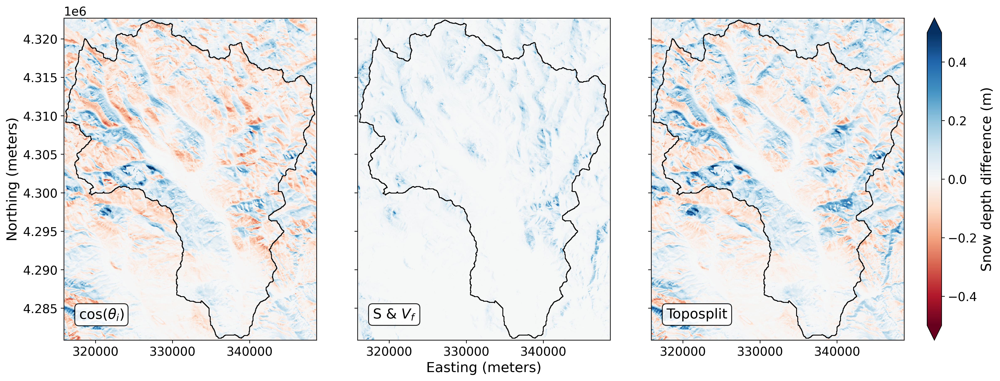

In [13]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Global font settings
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14
})

# Color limits and colormap
# dsw3_base['thickness']
# vmin = min([float(dsw3_base.min()), float(dsw3_shade.min()), float(dsw1_base.min())])
# vmax = max([float(dsw3_base.max()), float(dsw3_shade.max()), float(dsw1_base.max())])
vmin, vmax = -0.5, 0.5
abs_max = max(abs(vmin), abs(vmax))
cmap = 'RdBu'
# cmap = 'PuOr_r'

# Set up figure with GridSpec for clean layout including colorbar
fig = plt.figure(figsize=(16, 6), dpi=300, constrained_layout=True)
gs = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1, 1, 1, 0.05])

# Axes for plots
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])
ax2 = fig.add_subplot(gs[2])
cax = fig.add_subplot(gs[3])  # Colorbar axis

# Plot datasets in order: dsw1_base, dsw3_shade, dsw3_base
# im0 = dsw1_base.plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# dsw3_shade.plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# dsw3_base.plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
im0 = dsw1_base['thickness'].plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
dsw3_shade['thickness'].plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
dsw3_base['thickness'].plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)


# Overlay polygons with no fill, just boundaries
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=1)
gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=1)
gdf.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=1)
# import matplotlib.patches as patches


# Add shared colorbar
cbar = fig.colorbar(im0, cax=cax, orientation='vertical', extend='both')
cbar.set_label('Snow depth difference (m)', fontsize=16)

# Titles inside each plot
titles = ['Incidence angle', 'Shading and Sky View', 'Toposplit']
titles = [r'$\cos(\theta_i)$', r'S & $V_f$', 'Toposplit']
for ax, title in zip([ax0, ax1, ax2], titles):
    ax.text(0.06, 0.10, title, transform=ax.transAxes,
            fontsize=16, va='top', ha='left', # fontweight='bold', 
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))

# Axis labels
ax0.set_ylabel('Northing (meters)')
for ax in [ax1, ax2]:
    ax.set_ylabel('')
    ax.set_yticklabels([])

for ax in [ax0, ax1, ax2]:
    ax.tick_params(axis='x', labelrotation=0)

ax0.set_xlabel('')
ax1.set_xlabel('Easting (meters)')
ax2.set_xlabel('')

plt.show()
# svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-figs-july-2025/"
# plt.savefig(svpth + 'fig6-snow-spat-models.png', dpi=300, bbox_inches='tight')

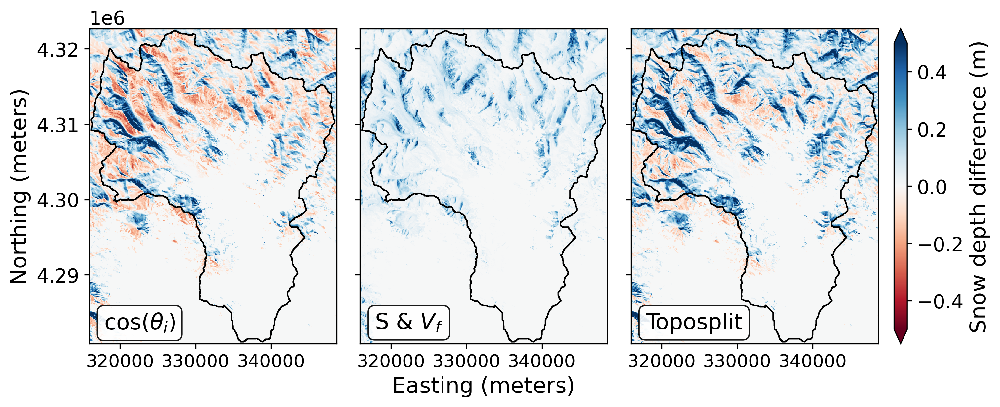

In [34]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Global font settings
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'xtick.labelsize': 13,
    'ytick.labelsize': 14
})

# Color limits and colormap
# vmin = min([float(apr1_day.min()), float(apr2_day.min()), float(apr3_day.min())])
# vmax = max([float(apr1_day.max()), float(apr2_day.max()), float(apr3_day.max())])
vmin, vmax = -0.5, 0.5  # Override for consistency
abs_max = max(abs(vmin), abs(vmax))
cmap = 'RdBu'

# Set up figure with GridSpec for clean layout including colorbar
# fig = plt.figure(figsize=(16, 6), dpi=300, constrained_layout=True)
fig = plt.figure(figsize=(10, 4), dpi=300, constrained_layout=True)
gs = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1, 1, 1, 0.05])

# Axes for plots
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])
ax2 = fig.add_subplot(gs[2])
cax = fig.add_subplot(gs[3])  # Colorbar axis

# Plot datasets in order: apr3_day, apr2_day, apr1_day
# im0 = apr3_day.plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# apr2_day.plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# apr1_day.plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
im0 = may3_day.plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
may2_day.plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
may1_day.plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# im0 = apr3_day['thickness'].plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# apr2_day['thickness'].plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# apr1_day['thickness'].plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)

# Overlay polygons if available (optional)
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=1)
gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=1)
gdf.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=1)

# Add shared colorbar
# cbar = fig.colorbar(im0, cax=cax, orientation='vertical')
cbar = fig.colorbar(im0, cax=cax, orientation='vertical', extend='both')
cbar.set_label('Snow depth difference (m)', fontsize=16)

# Titles inside each plot
titles = [r'$\cos(\theta_i)$', r'S & $V_f$', 'Toposplit']
for ax, title in zip([ax0, ax1, ax2], titles):
    ax.text(0.06, 0.10, title, transform=ax.transAxes,
            fontsize=16, va='top', ha='left',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))

# Axis labels
ax0.set_ylabel('Northing (meters)')
for ax in [ax1, ax2]:
    ax.set_ylabel('')
    ax.set_yticklabels([])

for ax in [ax0, ax1, ax2]:
    ax.tick_params(axis='x', labelrotation=0)

ax0.set_xlabel('')
ax1.set_xlabel('Easting (meters)')
ax2.set_xlabel('')

plt.show()
svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-oct/"
# plt.savefig(svpth + 'fig11-snow-spatial-May1-2023.png', dpi=300, bbox_inches='tight')
# plt.savefig(svpth + 'figS7-snow-spatial-Apr1.png', dpi=300, bbox_inches='tight')

In [24]:
apr1_day.min()
apr1.max()
# may1_day.max()

<xarray.DataArray 'thickness' ()> Size: 4B
array(0.97749436, dtype=float32)

In [29]:
may1_day.min()
may1_day.max()

<xarray.DataArray 'thickness' ()> Size: 4B
array(1.1999817, dtype=float32)

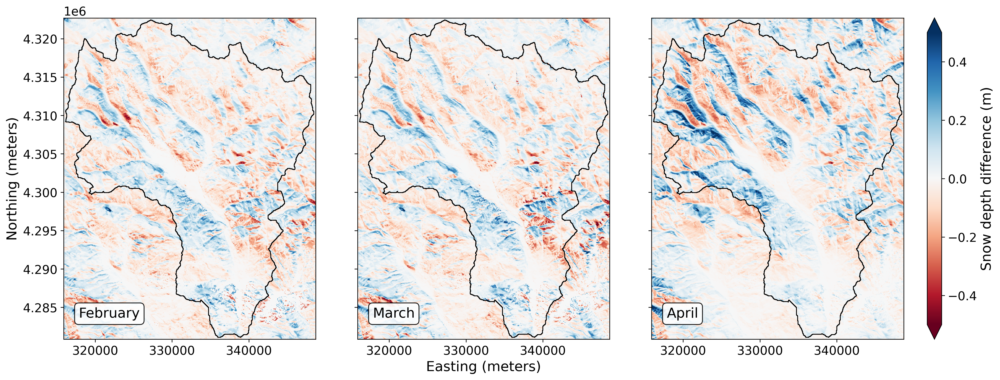

In [15]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Global font settings
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14
})

# Color limits and colormap
# vmin = min([float(apr1.min()), float(apr2.min()), float(apr3.min())])
# vmax = max([float(apr1.max()), float(apr2.max()), float(apr3.max())])
vmin, vmax = -0.5, 0.5
# vmin, vmax = -1, 1
abs_max = max(abs(vmin), abs(vmax))
cmap = 'RdBu'
# cmap = 'PuOr_r'

# Set up figure with GridSpec for clean layout including colorbar
fig = plt.figure(figsize=(16, 6), dpi=300, constrained_layout=True)
gs = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1, 1, 1, 0.05])

# Axes for plots
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])
ax2 = fig.add_subplot(gs[2])
cax = fig.add_subplot(gs[3])  # Colorbar axis

# Plot datasets in order: dsw1_base, dsw3_shade, dsw3_base
# im0 = feb3['thickness'].plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# mar3['thickness'].plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
# apr3['thickness'].plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
im0 = feb3.plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
mar3.plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
apr3.plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)


# Overlay polygons with no fill, just boundaries
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=1)
gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=1)
gdf.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=1)
# import matplotlib.patches as patches

# Add shared colorbar
cbar = fig.colorbar(im0, cax=cax, orientation='vertical', extend='both')
cbar.set_label('Snow depth difference (m)', fontsize=16)

# Titles inside each plot
titles = ['February', 'March', 'April']
# titles = [r'$\cos(\theta_i)$', r'S & $V_f$', 'Toposplit']
for ax, title in zip([ax0, ax1, ax2], titles):
    ax.text(0.06, 0.10, title, transform=ax.transAxes,
            fontsize=16, va='top', ha='left', # fontweight='bold', 
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))

# Axis labels
ax0.set_ylabel('Northing (meters)')
for ax in [ax1, ax2]:
    ax.set_ylabel('')
    ax.set_yticklabels([])

for ax in [ax0, ax1, ax2]:
    ax.tick_params(axis='x', labelrotation=0)

ax0.set_xlabel('')
ax1.set_xlabel('Easting (meters)')
ax2.set_xlabel('')

plt.show()
# svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-figs-july-2025/"
# plt.savefig(svpth + 'fig5-spatial-month-snow-illum.png', dpi=300, bbox_inches='tight')

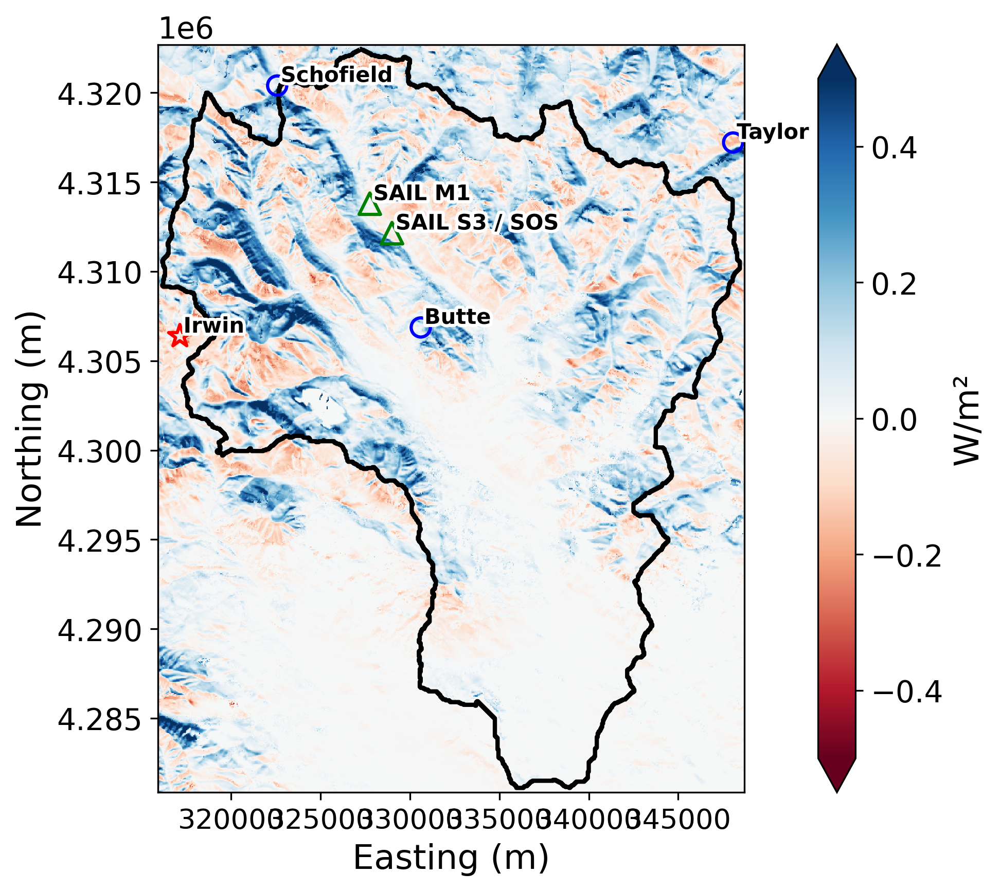

In [16]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import xarray as xr
import matplotlib.patheffects as path_effects

# --- UTM Zone 13N CRS ---
crs_utm13n = "EPSG:32613"

# --- Define points ---
triangle_points = {
    "SAIL M1": (327754.55, 4313790.30),
    "SAIL S3 / SOS": (328995.37, 4312141.89),
    # "SOS": (328982.06, 4312159.61)
}

circle_points = {
    "Irwin": (317131, 4306375),
    "Butte": (330605, 4306866),
    "Schofield": (322574, 4320403),
    "Taylor": (348074, 4317216)
}

# --- Create GeoDataFrames ---
triangles_gdf = gpd.GeoDataFrame({
    "name": list(triangle_points.keys()),
    "geometry": [Point(xy) for xy in triangle_points.values()]
}, crs=crs_utm13n)

circles_gdf = gpd.GeoDataFrame({
    "name": list(circle_points.keys()),
    "geometry": [Point(xy) for xy in circle_points.values()]
}, crs=crs_utm13n)

# Separate out Irwin
irwin_gdf = circles_gdf[circles_gdf['name'] == 'Irwin']
other_circles = circles_gdf[circles_gdf['name'] != 'Irwin']

# --- Color limits and colormap ---
# vmin = float(dsw3_base.min())
# vmax = float(dsw3_base.max())
vmin, vmax = -.5, .5
abs_max = max(abs(vmin), abs(vmax))
cmap = 'RdBu'
# cmap = 'PuOr_r'

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

# Plot raster
# im = dsw3_base.plot(ax=ax, cmap=cmap, vmin=-abs_max, vmax=abs_max,
#                     cbar_kwargs={'label': 'W/m²'})
im = apr1['thickness'].plot(ax=ax, cmap=cmap, vmin=-abs_max, vmax=abs_max,
                    cbar_kwargs={'label': 'W/m²', 'extend': 'both'})

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=2)


# Plot points
# triangles_gdf.plot(ax=ax, marker='^', color='green', markersize=100)
# other_circles.plot(ax=ax, marker='o', color='blue', markersize=80)
# irwin_gdf.plot(ax=ax, marker='*', color='red', markersize=120)
#
triangles_gdf.plot(ax=ax, marker='^', facecolor='none', edgecolor='green', linewidth=1.5, markersize=100)
other_circles.plot(ax=ax, marker='o', facecolor='none', edgecolor='blue', linewidth=1.5, markersize=80)
irwin_gdf.plot(ax=ax, marker='*', facecolor='none', edgecolor='red', linewidth=1.5, markersize=120)


# Label path effects (white outline for readability)
label_effect = [path_effects.Stroke(linewidth=3, foreground='white'),
                path_effects.Normal()]

# Add text labels
for df in [triangles_gdf, other_circles, irwin_gdf]:
    for _, row in df.iterrows():
        ax.text(row.geometry.x + 200, row.geometry.y + 200, row['name'],
                fontsize=10, color='black', fontweight='bold',
                path_effects=label_effect)

# Finalize
# ax.set_title("dsw3_base with Measurement Sites")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
plt.tight_layout()

plt.show()
svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-figs-july-2025/"
# plt.savefig(svpth + 'fig-spatial-sites-Apr1-snow.png', dpi=300, bbox_inches='tight')

# 

In [9]:
apr1_day['thickness'].max()

<xarray.DataArray 'thickness' ()> Size: 4B
array(1.2053305, dtype=float32)

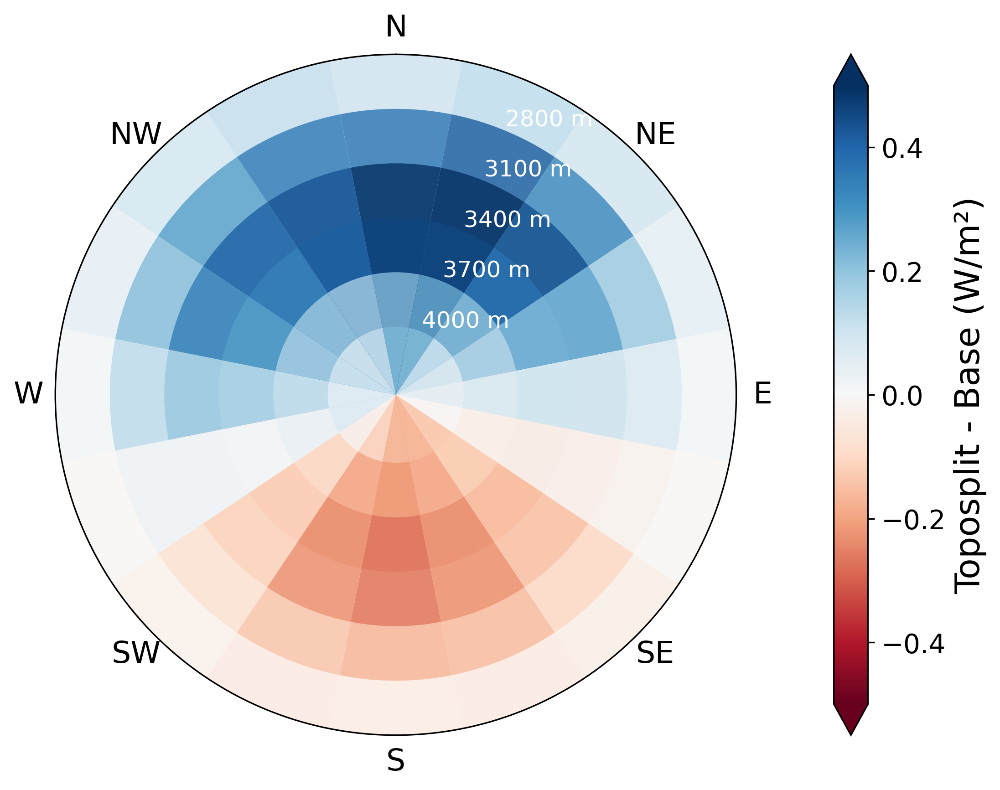

In [21]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects

# --- Load the DEM and mask ---
dem_ds = xr.open_dataset(ERW_TOPO_FILE)  # Replace with your DEM file
dem = dem_ds["dem"]
mask = dem_ds["mask"]  # binary mask (1 = valid, 0 = invalid)

# # #  # #

# --- Compute aspect ---
# Calculate gradients (assumes regular grid)
# dy, dx = np.gradient(dem.values, dem.y.values, dem.x.values)

# # aspect = np.arctan2(-dx, dy)  # In radians
# aspect = np.arctan2(dy, -dx)
# aspect = np.degrees(aspect)
# aspect = (aspect + 90) % 360  # Convert to 0-360 degrees

pth = "/uufs/chpc.utah.edu/common/home/u1037042/olson/snow-data/isnobal-data/dem_asp_mask.nc"
dem_2 = xr.open_dataset(pth)  
aspect = dem_2.variable.sel(z=2).values

# # # #

# Mask where elevation is nan or mask==0
mask_bool = (mask.values == 1) & ~np.isnan(dem.values) & ~np.isnan(apr1_day['thickness'].values)
# mask_bool = (mask.values == 1) & ~np.isnan(dem.values) & ~np.isnan(apr1_day.values)
# mask_bool = ~np.isnan(dem.values) 

# Apply mask to all variables
elevation = dem.values[mask_bool]
aspects = aspect[mask_bool]
# dsw_values = dsw3_base.values[mask_bool] 
dsw_values = apr1_day['thickness'].values[mask_bool] * 2
# dsw_values = apr1_day.values[mask_bool] * 2

# --- Bin aspect and elevation ---
num_aspect_bins = 16
aspect_bins = np.linspace(0, 360, num_aspect_bins + 1)
aspect_binned = np.digitize(aspects, aspect_bins) - 1  # 0-based indexing

elevation_bins = [2500, 2700, 2900, 3200, 3500, 3700, 4000, 4300]
elevation_bins = [2350, 2800, 3100, 3400, 3700, 4000, 4450]
elevation_binned = np.digitize(elevation, elevation_bins) - 1

# --- Aggregate dsw3_base by aspect and elevation bins ---
aggregated_values = []
for aspect_bin in range(num_aspect_bins):
    for elev_bin in range(len(elevation_bins) - 1):
        m = (aspect_binned == aspect_bin) & (elevation_binned == elev_bin)
        vals = dsw_values[m]
        aggregated_values.append(np.mean(vals) if len(vals) > 0 else np.nan)
aggregated_values = np.array(aggregated_values)

# --- Plot rose diagram ---
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 6), dpi=300)

angles = np.linspace(0, 2 * np.pi, num_aspect_bins, endpoint=False)
radius = np.linspace(1, 0.2, len(elevation_bins) - 1)

# Normalize color range for dsw3_base
vmin, vmax = -100, 100  # Adjust based on your range
vmin, vmax = -.5, .5
# cmap = cm.BuPu_r
# cmap = cm.PuOr_r
cmap = cm.RdBu
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
bar_width = 2 * np.pi / num_aspect_bins

# Plot bars
for aspect_bin in range(num_aspect_bins):
    for elev_bin in range(len(elevation_bins) - 1):
        idx = aspect_bin * (len(elevation_bins) - 1) + elev_bin
        val = aggregated_values[idx]
        color = cmap(norm(val)) if not np.isnan(val) else "lightgray"
        ax.bar(angles[aspect_bin], radius[elev_bin],
               width=bar_width, bottom=0, color=color, alpha=0.8)

# Set polar plot properties
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

aspect_labels = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
                 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
aspect_labels = ['N', '', 'NE', '', 'E', '', 'SE', '',
                 'S', '', 'SW', '', 'W', '', 'NW', '']
ax.set_xticks(angles)
ax.set_xticklabels(aspect_labels, size=16)

ax.set_yticks(radius)
ax.set_yticklabels([f"{elev} m" for elev in elevation_bins[:-1]], size=12, color="white")
ax.set_ylim(0, 1)
ax.grid(False)

# Colorbar
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, pad=0.1, extend='both')
# cbar.set_label('Mean dsw3_base (W/m²)', fontsize=14)
cbar.set_label('Toposplit - Base (W/m²)', size =18)

# Title
ax.set_title("", size=16, pad=20)

plt.tight_layout()

plt.show()
svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-figs-july-2025/"
# plt.savefig(svpth + 'fig-polar-diff-Apr1-snow-scaled5', dpi=300, bbox_inches='tight')

In [17]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import xarray as xr
import matplotlib.patheffects as path_effects

# --- UTM Zone 13N CRS ---
crs_utm13n = "EPSG:32613"

# --- Define points ---
triangle_points = {
    "SAIL M1": (327754.55, 4313790.30),
    "SAIL S3 / SOS": (328995.37, 4312141.89),
    # "SOS": (328982.06, 4312159.61)
}

circle_points = {
    "Irwin": (317131, 4306375),
    "Butte": (330605, 4306866),
    "Schofield": (322574, 4320403),
    # "Taylor": (348074, 4317216)
}

# --- Create GeoDataFrames ---
triangles_gdf = gpd.GeoDataFrame({
    "name": list(triangle_points.keys()),
    "geometry": [Point(xy) for xy in triangle_points.values()]
}, crs=crs_utm13n)

circles_gdf = gpd.GeoDataFrame({
    "name": list(circle_points.keys()),
    "geometry": [Point(xy) for xy in circle_points.values()]
}, crs=crs_utm13n)

# Separate out Irwin
irwin_gdf = circles_gdf[circles_gdf['name'] == 'Irwin']
other_circles = circles_gdf[circles_gdf['name'] != 'Irwin']



In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.patheffects as path_effects
from matplotlib.colors import TwoSlopeNorm

mask = dem_ds["mask"]

# --- Filter valid pixels ---
valid_mask = (
    (mask == 1) &
    ~np.isnan(dem.data) &
    ~np.isnan(apr1_day.data) &
    # ~np.isnan(apr1_day) &
    ~np.isnan(slope) &
    (slope >= 1)
)

# Apply mask
elevation = dem.data[valid_mask]
# elevation = dem[valid_mask]
aspect_deg = aspect[valid_mask] % 360
dsw_values = apr1_day.data[valid_mask]  # ← use apr1_day here
# dsw_values = apr1_day[valid_mask]
slope_values = slope[valid_mask]

# --- Aspect masks ---
aspect_masks = {
    'North': (aspect_deg >= 315) | (aspect_deg < 45),
    'South': (aspect_deg >= 135) & (aspect_deg < 225),
}

# --- Elevation binning ---
bin_width = 100
elev_min = np.floor(elevation.min() / bin_width) * bin_width
elev_max = np.ceil(elevation.max() / bin_width) * bin_width
elev_bins = np.arange(elev_min, elev_max + bin_width, bin_width)

# --- Color settings ---
dsw_vmin, dsw_vmax = -0.5, 0.5
cmap = 'RdBu'
norm = Normalize(vmin=dsw_vmin, vmax=dsw_vmax)

# --- Area conversion ---
pixel_area_km2 = (50 * 50) / 1e6

# --- Setup figure ---
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300, 
                        gridspec_kw={'width_ratios': [1, 0.5]})

# === 1. DSW Raster Map ===
ax0 = axs[0]
im = apr1.plot(ax=ax0, cmap=cmap, norm=norm,
                   cbar_kwargs={'label': 'Toposplit - SW base (m)', 'extend': 'both'})
im.colorbar.ax.yaxis.label.set_size(16) 

# Overlays
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=2)
triangles_gdf.plot(ax=ax0, marker='^', facecolor='none', edgecolor='green', linewidth=1.5, markersize=100)
other_circles.plot(ax=ax0, marker='o', facecolor='none', edgecolor='blue', linewidth=1.5, markersize=80)
irwin_gdf.plot(ax=ax0, marker='*', facecolor='none', edgecolor='red', linewidth=1.5, markersize=120)

# Labels
label_effect = [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
for df in [triangles_gdf, other_circles, irwin_gdf]:
    for _, row in df.iterrows():
        ax0.text(row.geometry.x + 200, row.geometry.y + 200, row['name'],
                 fontsize=14, color='black', fontweight='bold', path_effects=label_effect)

ax0.set_xlabel("Easting (m)", fontsize=16)
ax0.set_ylabel("Northing (m)", fontsize=16)

ax0.tick_params(axis='both', labelsize=16)

# === 2. Combined Hypsometric Plot ===
ax1 = axs[1]

area_data = {}
mean_dsw_data = {}

for direction, mask in aspect_masks.items():
    elev_dir = elevation[mask]
    dsw_dir = dsw_values[mask]

    bin_indices = np.digitize(elev_dir, elev_bins)
    area_list = []
    mean_dsw_list = []

    for i in range(1, len(elev_bins)):
        bin_mask = bin_indices == i
        area_list.append(np.sum(bin_mask) * pixel_area_km2)
        mean_dsw_list.append(np.nanmean(dsw_dir[bin_mask]) if np.any(bin_mask) else np.nan)

    area_data[direction] = np.array(area_list)
    mean_dsw_data[direction] = np.array(mean_dsw_list)

# Stack bars
bar_bottoms = elev_bins[:-1]
north_area = area_data['North']
south_area = area_data['South']
north_colors = get_cmap(cmap)(norm(mean_dsw_data['North']))
south_colors = get_cmap(cmap)(norm(mean_dsw_data['South']))


ax1.barh(bar_bottoms, north_area, height=bin_width, color=north_colors, edgecolor='k', align='edge', label='North-facing')
ax1.barh(bar_bottoms, south_area, height=bin_width, color=south_colors, edgecolor='k', align='edge',
         left=north_area, label='South-facing')

from matplotlib.patches import Patch
from matplotlib.cm import get_cmap

cmap = get_cmap('RdBu')
medium_red = cmap(0.4)   # low end = red
medium_blue = cmap(0.6)  # high end = blue

legend_handles = [
    Patch(facecolor=medium_blue, edgecolor='k', label='North-facing'),
    Patch(facecolor=medium_red, edgecolor='k', label='South-facing')
]

ax1.invert_xaxis()
ax1.yaxis.tick_right()
ax1.yaxis.set_label_position("right")
ax1.set_ylabel("Elevation (m)", fontsize=16)
ax1.set_xlabel("Area (km²)", fontsize=16)
ax1.tick_params(labelsize=14)
ax1.grid(True, axis='x')
# ax1.legend(loc='lower left', fontsize=12)
ax1.legend(handles=legend_handles, loc='lower left', fontsize=14)

plt.tight_layout()
plt.show()

svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-sep/"
# plt.savefig(svpth + 'fig07-snow-spatial-hypso-apr1.png', dpi=300, bbox_inches='tight')

AttributeError: 'Dataset' object has no attribute 'data'

/scratch/local/u1037042/6836649/ipykernel_3304143/2860945426.py:102: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  north_colors = get_cmap(cmap)(norm(mean_dsw_data['North']))
/scratch/local/u1037042/6836649/ipykernel_3304143/2860945426.py:103: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  south_colors = get_cmap(cmap)(norm(mean_dsw_data['South']))
/scratch/local/u1037042/6836649/ipykernel_3304143/2860945426.py:113: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  c

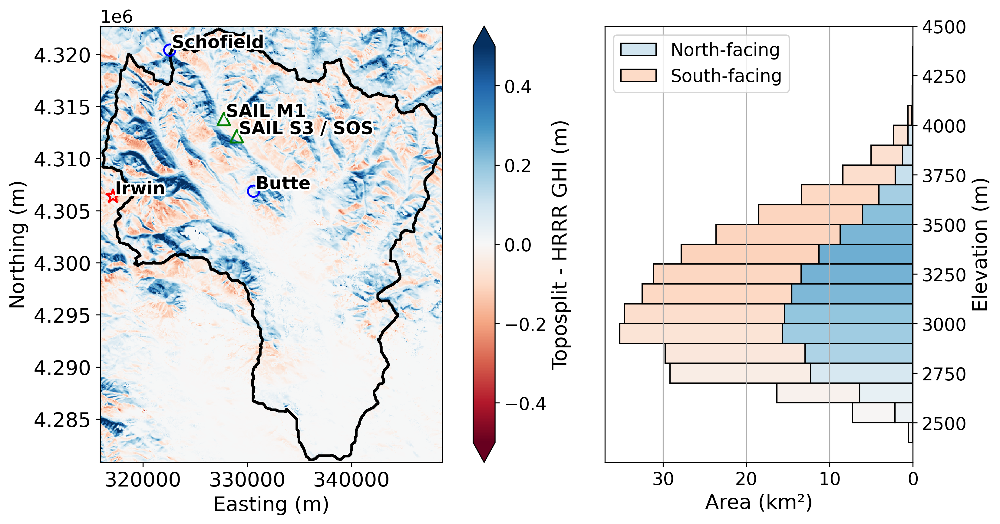

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.patheffects as path_effects
from matplotlib.colors import TwoSlopeNorm

mask = dem_ds["mask"]

# --- Filter valid pixels ---
valid_mask = (
    (mask == 1) &
    ~np.isnan(dem.data) &
    ~np.isnan(apr1_day['thickness'].values) &
    # ~np.isnan(apr1_day) &
    ~np.isnan(slope) &
    (slope >= 1)
)

# Apply mask
elevation = dem.data[valid_mask]
# elevation = dem[valid_mask]
aspect_deg = aspect[valid_mask] % 360
dsw_values = apr1_day['thickness'].values[valid_mask]  # ← use apr1_day here
# dsw_values = apr1_day[valid_mask]
slope_values = slope[valid_mask]

# --- Aspect masks ---
aspect_masks = {
    'North': (aspect_deg >= 315) | (aspect_deg < 45),
    'South': (aspect_deg >= 135) & (aspect_deg < 225),
}

# --- Elevation binning ---
bin_width = 100
elev_min = np.floor(elevation.min() / bin_width) * bin_width
elev_max = np.ceil(elevation.max() / bin_width) * bin_width
elev_bins = np.arange(elev_min, elev_max + bin_width, bin_width)

# --- Color settings ---
dsw_vmin, dsw_vmax = -0.5, 0.5
cmap = 'RdBu'
norm = Normalize(vmin=dsw_vmin, vmax=dsw_vmax)

# --- Area conversion ---
pixel_area_km2 = (50 * 50) / 1e6

# --- Setup figure ---
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300, 
                        gridspec_kw={'width_ratios': [1, 0.5]})

# === 1. DSW Raster Map ===
ax0 = axs[0]
im = apr1['thickness'].plot(ax=ax0, cmap=cmap, norm=norm,
                   cbar_kwargs={'label': 'Toposplit - HRRR GHI (m)', 'extend': 'both'})
im.colorbar.ax.yaxis.label.set_size(16) 

# Overlays
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=2)
triangles_gdf.plot(ax=ax0, marker='^', facecolor='none', edgecolor='green', linewidth=1.5, markersize=100)
other_circles.plot(ax=ax0, marker='o', facecolor='none', edgecolor='blue', linewidth=1.5, markersize=80)
irwin_gdf.plot(ax=ax0, marker='*', facecolor='none', edgecolor='red', linewidth=1.5, markersize=120)

# Labels
label_effect = [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
for df in [triangles_gdf, other_circles, irwin_gdf]:
    for _, row in df.iterrows():
        ax0.text(row.geometry.x + 200, row.geometry.y + 200, row['name'],
                 fontsize=14, color='black', fontweight='bold', path_effects=label_effect)

ax0.set_xlabel("Easting (m)", fontsize=16)
ax0.set_ylabel("Northing (m)", fontsize=16)

ax0.tick_params(axis='both', labelsize=16)

# === 2. Combined Hypsometric Plot ===
ax1 = axs[1]

area_data = {}
mean_dsw_data = {}

for direction, mask in aspect_masks.items():
    elev_dir = elevation[mask]
    dsw_dir = dsw_values[mask]

    bin_indices = np.digitize(elev_dir, elev_bins)
    area_list = []
    mean_dsw_list = []

    for i in range(1, len(elev_bins)):
        bin_mask = bin_indices == i
        area_list.append(np.sum(bin_mask) * pixel_area_km2)
        mean_dsw_list.append(np.nanmean(dsw_dir[bin_mask]) if np.any(bin_mask) else np.nan)

    area_data[direction] = np.array(area_list)
    mean_dsw_data[direction] = np.array(mean_dsw_list)

# Stack bars
bar_bottoms = elev_bins[:-1]
north_area = area_data['North']
south_area = area_data['South']
north_colors = get_cmap(cmap)(norm(mean_dsw_data['North']))
south_colors = get_cmap(cmap)(norm(mean_dsw_data['South']))


ax1.barh(bar_bottoms, north_area, height=bin_width, color=north_colors, edgecolor='k', align='edge', label='North-facing')
ax1.barh(bar_bottoms, south_area, height=bin_width, color=south_colors, edgecolor='k', align='edge',
         left=north_area, label='South-facing')

from matplotlib.patches import Patch
from matplotlib.cm import get_cmap

cmap = get_cmap('RdBu')
medium_red = cmap(0.4)   # low end = red
medium_blue = cmap(0.6)  # high end = blue

legend_handles = [
    Patch(facecolor=medium_blue, edgecolor='k', label='North-facing'),
    Patch(facecolor=medium_red, edgecolor='k', label='South-facing')
]

ax1.invert_xaxis()
ax1.yaxis.tick_right()
ax1.yaxis.set_label_position("right")
ax1.set_ylabel("Elevation (m)", fontsize=16)
ax1.set_xlabel("Area (km²)", fontsize=16)
ax1.tick_params(labelsize=14)
ax1.grid(True, axis='x')
ax1.legend(handles=legend_handles, loc='upper left', fontsize=14)

plt.tight_layout()

plt.show()
svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-oct/"
# plt.savefig(svpth + 'fig09-snow-spatial-hypso-apr1.png', dpi=300, bbox_inches='tight')

/scratch/local/u1037042/6836649/ipykernel_3304143/3471018546.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(cmap_name)


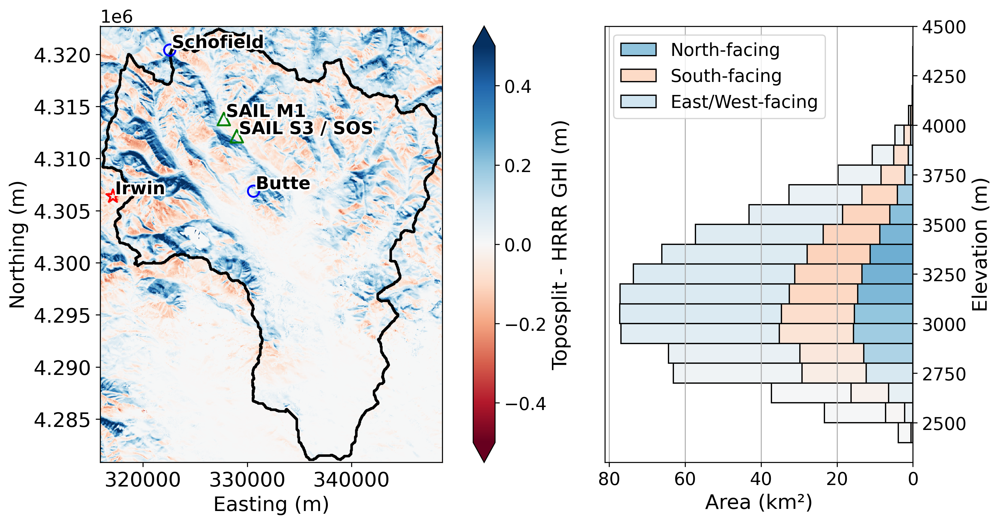

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.patheffects as path_effects
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Patch

mask = dem_ds["mask"]

# --- Filter valid pixels ---
valid_mask = (
    (mask == 1) &
    ~np.isnan(dem.data) &
    ~np.isnan(apr1_day['thickness'].values) &
    ~np.isnan(slope) &
    (slope >= 1)
)

# Apply mask
elevation = dem.data[valid_mask]
aspect_deg = aspect[valid_mask] % 360
dsw_values = apr1_day['thickness'].values[valid_mask]  # Use thickness
slope_values = slope[valid_mask]

# --- Aspect masks (now 3 categories) ---
aspect_masks = {
    'North': (aspect_deg >= 315) | (aspect_deg < 45),
    'South': (aspect_deg >= 135) & (aspect_deg < 225),
    'East-West': ((aspect_deg >= 45) & (aspect_deg < 135)) | ((aspect_deg >= 225) & (aspect_deg < 315))
}

# --- Elevation binning ---
bin_width = 100
elev_min = np.floor(elevation.min() / bin_width) * bin_width
elev_max = np.ceil(elevation.max() / bin_width) * bin_width
elev_bins = np.arange(elev_min, elev_max + bin_width, bin_width)

# --- Color settings ---
dsw_vmin, dsw_vmax = -0.5, 0.5
cmap_name = 'RdBu'
cmap = get_cmap(cmap_name)
norm = Normalize(vmin=dsw_vmin, vmax=dsw_vmax)

# --- Area conversion ---
pixel_area_km2 = (50 * 50) / 1e6

# --- Setup figure ---
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300, 
                        gridspec_kw={'width_ratios': [1, 0.5]})

# === 1. DSW Raster Map ===
ax0 = axs[0]
im = apr1['thickness'].plot(ax=ax0, cmap=cmap_name, norm=norm,
                            cbar_kwargs={'label': 'Toposplit - HRRR GHI (m)', 'extend': 'both'})
im.colorbar.ax.yaxis.label.set_size(16) 

# Overlays
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=2)
triangles_gdf.plot(ax=ax0, marker='^', facecolor='none', edgecolor='green', linewidth=1.5, markersize=100)
other_circles.plot(ax=ax0, marker='o', facecolor='none', edgecolor='blue', linewidth=1.5, markersize=80)
irwin_gdf.plot(ax=ax0, marker='*', facecolor='none', edgecolor='red', linewidth=1.5, markersize=120)

# Labels
label_effect = [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
for df in [triangles_gdf, other_circles, irwin_gdf]:
    for _, row in df.iterrows():
        ax0.text(row.geometry.x + 200, row.geometry.y + 200, row['name'],
                 fontsize=14, color='black', fontweight='bold', path_effects=label_effect)

ax0.set_xlabel("Easting (m)", fontsize=16)
ax0.set_ylabel("Northing (m)", fontsize=16)
ax0.tick_params(axis='both', labelsize=16)

# === 2. Combined Hypsometric Plot ===
ax1 = axs[1]

area_data = {}
mean_dsw_data = {}

for direction, dir_mask in aspect_masks.items():
    elev_dir = elevation[dir_mask]
    dsw_dir = dsw_values[dir_mask]

    bin_indices = np.digitize(elev_dir, elev_bins)
    area_list = []
    mean_dsw_list = []

    for i in range(1, len(elev_bins)):
        bin_mask = bin_indices == i
        area_list.append(np.sum(bin_mask) * pixel_area_km2)
        mean_dsw_list.append(np.nanmean(dsw_dir[bin_mask]) if np.any(bin_mask) else np.nan)

    area_data[direction] = np.array(area_list)
    mean_dsw_data[direction] = np.array(mean_dsw_list)

# Stack bars: North -> South -> East-West
bar_bottoms = elev_bins[:-1]

north_area = area_data['North']
south_area = area_data['South']
ew_area = area_data['East-West']

north_colors = cmap(norm(mean_dsw_data['North']))
south_colors = cmap(norm(mean_dsw_data['South']))
ew_colors = cmap(norm(mean_dsw_data['East-West']))

# Plot bars
ax1.barh(bar_bottoms, north_area, height=bin_width, color=north_colors, edgecolor='k', align='edge', label='North-facing')
ax1.barh(bar_bottoms, south_area, height=bin_width, color=south_colors, edgecolor='k', align='edge',
         left=north_area, label='South-facing')
ax1.barh(bar_bottoms, ew_area, height=bin_width, color=ew_colors, edgecolor='k', align='edge',
         left=north_area + south_area, label='East/West-facing')

# Legend with example colors
legend_handles = [
    Patch(facecolor=cmap(norm(0.2)), edgecolor='k', label='North-facing'),
    Patch(facecolor=cmap(norm(-0.1)), edgecolor='k', label='South-facing'),
    Patch(facecolor=cmap(norm(0.1)), edgecolor='k', label='East/West-facing')
]

# Axis formatting
ax1.invert_xaxis()
ax1.yaxis.tick_right()
ax1.yaxis.set_label_position("right")
ax1.set_ylabel("Elevation (m)", fontsize=16)
ax1.set_xlabel("Area (km²)", fontsize=16)
ax1.tick_params(labelsize=14)
ax1.grid(True, axis='x')
ax1.legend(handles=legend_handles, loc='upper left', fontsize=14)

plt.tight_layout()

plt.show()
svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-oct/"
# plt.savefig(svpth + 'fig09-snow-spatial-hypso-apr1-2.png', dpi=300, bbox_inches='tight')

/scratch/local/u1037042/5865331/ipykernel_1142963/3610091789.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('RdBu')
/scratch/local/u1037042/5865331/ipykernel_1142963/3610091789.py:118: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend().remove()


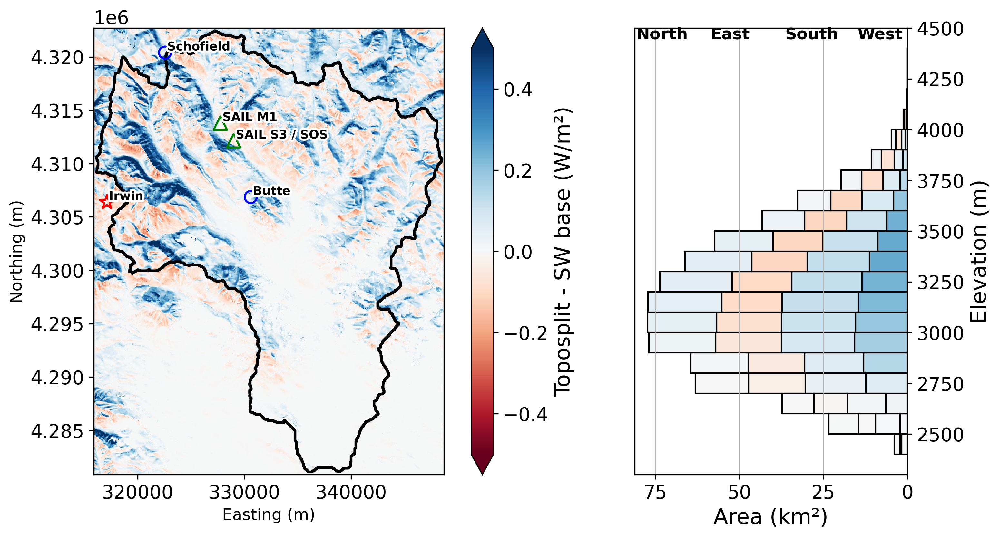

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.patheffects as path_effects

# --- Filter valid pixels ---
mask = dem_ds["mask"]
valid_mask = (
    (mask == 1) &
    ~np.isnan(dem.data) &
    ~np.isnan(apr1_day.data) &
    ~np.isnan(slope) &
    (slope >= 1)
)

# --- Extract data ---
elevation = dem.data[valid_mask]
aspect_deg = aspect[valid_mask] % 360
dsw_values = apr1_day.data[valid_mask]
slope_values = slope[valid_mask]

# --- Aspect direction masks ---
aspect_masks = {
    'North': (aspect_deg >= 315) | (aspect_deg < 45),
    'East':  (aspect_deg >= 45) & (aspect_deg < 135),
    'South': (aspect_deg >= 135) & (aspect_deg < 225),
    'West':  (aspect_deg >= 225) & (aspect_deg < 315),
}

# --- Elevation bins ---
bin_width = 100
elev_min = np.floor(elevation.min() / bin_width) * bin_width
elev_max = np.ceil(elevation.max() / bin_width) * bin_width
elev_bins = np.arange(elev_min, elev_max + bin_width, bin_width)
bar_bottoms = elev_bins[:-1]

# --- Color settings ---
dsw_vmin, dsw_vmax = -0.5, 0.5
cmap = get_cmap('RdBu')
norm = Normalize(vmin=dsw_vmin, vmax=dsw_vmax)

# --- Pixel area ---
pixel_area_km2 = (50 * 50) / 1e6

# --- Setup figure ---
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300,
                        gridspec_kw={'width_ratios': [1, 0.5]})

# === 1. DSW Raster Map ===
ax0 = axs[0]
im = apr1.plot(ax=ax0, cmap='RdBu', norm=norm,
               cbar_kwargs={'label': 'Toposplit - SW base (W/m²)', 'extend': 'both'})

# Plot overlays
gdf.plot(ax=ax0, facecolor='none', edgecolor='black', linewidth=2)
triangles_gdf.plot(ax=ax0, marker='^', facecolor='none', edgecolor='green', linewidth=1.5, markersize=100)
other_circles.plot(ax=ax0, marker='o', facecolor='none', edgecolor='blue', linewidth=1.5, markersize=80)
irwin_gdf.plot(ax=ax0, marker='*', facecolor='none', edgecolor='red', linewidth=1.5, markersize=120)

# Add text labels
label_effect = [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
for df in [triangles_gdf, other_circles, irwin_gdf]:
    for _, row in df.iterrows():
        ax0.text(row.geometry.x + 200, row.geometry.y + 200, row['name'],
                 fontsize=9, color='black', fontweight='bold', path_effects=label_effect)

ax0.set_xlabel("Easting (m)", fontsize=12)
ax0.set_ylabel("Northing (m)", fontsize=12)

# === 2. Combined Hypsometric Plot ===
ax1 = axs[1]
left = np.zeros_like(bar_bottoms)

# Store mid-points for labeling
direction_centers = {}

# Plot each direction
for direction in ['North', 'East', 'South', 'West']:
    dir_mask = aspect_masks[direction]
    elev_dir = elevation[dir_mask]
    dsw_dir = dsw_values[dir_mask]

    bin_indices = np.digitize(elev_dir, elev_bins)
    area_list = []
    mean_dsw_list = []

    for i in range(1, len(elev_bins)):
        bin_mask = bin_indices == i
        area = np.sum(bin_mask) * pixel_area_km2
        mean_val = np.nanmean(dsw_dir[bin_mask]) if np.any(bin_mask) else np.nan
        area_list.append(area)
        mean_dsw_list.append(mean_val)

    area_arr = np.array(area_list)
    mean_dsw_arr = np.array(mean_dsw_list)
    colors = cmap(norm(mean_dsw_arr))

    ax1.barh(bar_bottoms, area_arr, height=bin_width,
             color=colors, edgecolor='k', align='edge',
             left=left)

    # Store center of stack for labeling
    direction_centers[direction] = left + area_arr / 2

    left += area_arr

# Invert x-axis and format
ax1.invert_xaxis()
ax1.yaxis.tick_right()
ax1.yaxis.set_label_position("right")
ax1.set_ylabel("Elevation (m)", fontsize=16)
ax1.set_xlabel("Area (km²)", fontsize=16)
ax1.tick_params(labelsize=14)
ax1.grid(True, axis='x')

# Remove legend
ax1.legend().remove()

# # Add top labels from right to left
# top_y = elev_bins[-1] + bin_width * 0.1  # just above the top bin

# # Sort directions to place labels right → left
# for direction in ['West', 'South', 'East', 'North']:
#     centers = direction_centers[direction]
#     avg_center = np.nanmean(centers)
#     ax1.text(avg_center, top_y, direction + '    ' , fontsize=12, ha='center', va='bottom', fontweight='bold')


# # --- Label direction names across top of hypsometry plot ---

# top_y = elev_bins[-1] + bin_width * 0.4  # slightly above top bar

# # Set horizontal offset (left/right shift) and vertical offset (up/down shift)
# x_offset = -0.8  # negative: shift left, positive: shift right
# y_offset = -10   # negative: shift down, adjust as needed

# # Directions (from right to left due to inverted x-axis)
# for direction in ['West', 'South', 'East', 'North']:
#     centers = direction_centers[direction]
#     avg_center = np.nanmean(centers)
    
#     if np.isnan(avg_center):
#         continue  # skip if direction has no data

#     ax1.text(avg_center + x_offset, top_y + y_offset, direction,
#              fontsize=12, ha='center', va='top', fontweight='bold')

# Define horizontal label positions manually (from right to left due to inverted x-axis)
# You can tweak these x values to space labels evenly.
label_positions = [0.9, 0.65, 0.35, 0.1]  # expressed as fraction of axis width
label_names = ['West', 'South', 'East', 'North']

# Convert axis limits to data coordinates
xlims = ax1.get_xlim()
x_span = xlims[1] - xlims[0]
top_y = elev_bins[-1] + bin_width * 0.3  # y-position slightly above top bar

for xpos, label in zip(label_positions, label_names):
    x_coord = xlims[0] + xpos * x_span
    ax1.text(x_coord, top_y, label,
             fontsize=12, ha='center', va='bottom', fontweight='bold')


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Global font settings
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14
})

# Color limits and colormap
vmin = min([float(apr1.min()), float(apr2.min()), float(apr3.min()), float(may1.min())])
vmax = max([float(apr1.max()), float(apr2.max()), float(apr3.max()), float(may1.max())])
abs_max = max(abs(vmin), abs(vmax))
cmap = 'RdBu'
# cmap = 'PuOr_r'

# Set up figure with GridSpec for clean layout including colorbar
fig = plt.figure(figsize=(20, 6), dpi=300, constrained_layout=True)
gs = gridspec.GridSpec(1, 5, figure=fig, width_ratios=[1, 1, 1, 1, 0.05])  # 4 plots + 1 colorbar

# Axes for plots
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])
ax2 = fig.add_subplot(gs[2])
ax3 = fig.add_subplot(gs[3])  # New axis for May
cax = fig.add_subplot(gs[4])  # Colorbar axis

# Plot datasets
im0 = feb1.plot(ax=ax0, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
mar1.plot(ax=ax1, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
apr1.plot(ax=ax2, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)
may1.plot(ax=ax3, cmap=cmap, vmin=-abs_max, vmax=abs_max, add_colorbar=False)  # May plot

# Overlay polygons
for ax in [ax0, ax1, ax2, ax3]:
    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=2)

# Add shared colorbar
cbar = fig.colorbar(im0, cax=cax, orientation='vertical')
cbar.set_label('W/m²', fontsize=16)

# Titles inside each plot
titles = ['February', 'March', 'April', 'May']
for ax, title in zip([ax0, ax1, ax2, ax3], titles):
    ax.text(0.06, 0.10, title, transform=ax.transAxes,
            fontsize=16, va='top', ha='left',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))

# Axis labels
ax0.set_ylabel('Northing (meters)')
for ax in [ax1, ax2, ax3]:
    ax.set_ylabel('')
    ax.set_yticklabels([])

for ax in [ax0, ax1, ax2, ax3]:
    ax.tick_params(axis='x', labelrotation=0)

ax0.set_xlabel('')
ax1.set_xlabel('Easting (meters)')
ax2.set_xlabel('')
ax3.set_xlabel('')

plt.show()
# svpth = "/uufs/chpc.utah.edu/common/home/u1037042/Documents/figures-2025/isnobal-2025-v01/"
# plt.savefig(svpth + 'fig-spatial-month-means-black.png', dpi=300, bbox_inches='tight')
